In [18]:
from astropy.table import Table, Column, join
from astropy.coordinates import SkyCoord
from astropy.table import Column
from astropy.io import ascii
from astropy import constants as const
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib as mpl
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
#from astropy.cosmology import Planck18 as cosmo
import pandas as pd
import pprint
import sys
import operator
from scipy import optimize
from scipy import stats
from scipy.optimize import curve_fit
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=71, Om0=0.27)
import seaborn as sbrn
from scipy.spatial.distance import cdist, euclidean
import cmastro.cm as cma
plt.rcParams['figure.dpi'] = 400
plt.rcParams['figure.figsize'] = [12,10]

In [19]:
data = ascii.read("prospector_UVJ_galfit_FAST_ERRCORR.csv", format='csv')
columns = pd.read_csv('prospector_UVJ_galfit_FAST_ERRCORR.csv', index_col=0, nrows=0).columns.tolist()
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(columns)
print(data)

[   'objname',
    'f',
    'f_f125w',
    'z',
    'UV',
    'VJ',
    're',
    'dre',
    're_f125w',
    'dre_f125w',
    'mag_f125w',
    'dmag_f125w',
    'mag_f160w',
    'dmag_f160w',
    'FAST_lmass',
    'logstellar_mass_median',
    'logstellar_mass_errup',
    'logstellar_mass_errdown',
    'sfr_100myr_median',
    'sfr_100myr_errup',
    'sfr_100myr_errdown',
    'logssfr_100myr_median',
    'logssfr_100myr_errup',
    'logssfr_100myr_errdown',
    'logzsol_median',
    'logzsol_errup',
    'logzsol_errdown',
    'tau_dust_median',
    'tau_dust_errup',
    'tau_dust_errdown',
    'avg_age_median',
    'avg_age_errup',
    'avg_age_errdown',
    'q',
    'dq']
 col0  objname   f  f_f125w ... avg_age_errup avg_age_errdown   q        dq   
----- --------- --- ------- ... ------------- --------------- ------ ---------
    0  AEGIS_13 0.0     1.0 ...        2.6073          2.0686  0.486 0.0127806
    1  AEGIS_17 0.0     1.0 ...        1.5864          0.9056   0.73 0.0504242
  

In [20]:
#data from csv
redshift_data = data['z']
lmass_data = data['logstellar_mass_median']
lmass_errup_data = -data['logstellar_mass_median']+data['logstellar_mass_errup']
lmass_errdn_data = data['logstellar_mass_median']-data['logstellar_mass_errdown']
ssfr_data = data['logssfr_100myr_median']
ssfr_errup_data = -data['logssfr_100myr_median']+data['logssfr_100myr_errup']
ssfr_errdn_data = data['logssfr_100myr_median']-data['logssfr_100myr_errdown']
f125w_radius_data = data['re_f125w']
f160w_radius_data = data['re']
f125w_radius_err_data = data['dre_f125w']
f160w_radius_err_data = data['dre']
UVcol_data = data['UV']
VJcol_data = data['VJ']
f125w_flags = data['f_f125w']
f160w_flags = data['f']
FAST_lmass_data = data['FAST_lmass']
f125w_mag_data = data['mag_f125w']
f160w_mag_data = data['mag_f160w']

#print(np.array(f160w_radius_data))


arcrad_5000 = []
arcrad_5000_err = []
flags = []

#convert observed angular size to 5000A rest-frame size
for i, z in enumerate(redshift_data):
    if z<=1.5:
        arcrad_5000.append(f125w_radius_data[i]*((1+z)/(1+1.5))**(-0.35+0.12*z-0.25*(lmass_data[i]/10)))
        arcrad_5000_err.append(f125w_radius_err_data[i]*((1+z)/(1+1.5))**(-0.35+0.12*z-0.25*(lmass_data[i]/10)))
        flags.append(f125w_flags[i])
    else:
        arcrad_5000.append(f160w_radius_data[i]*((1+z)/(1+2.2))**(-0.35+0.12*z-0.25*(lmass_data[i]/10)))
        arcrad_5000_err.append(f160w_radius_err_data[i]*((1+z)/(1+2.2))**(-0.35+0.12*z-0.25*(lmass_data[i]/10)))
        flags.append(f160w_flags[i])
        
#conversion to numpy arrays
flags = np.asarray(flags)
R_eff_arc = np.asarray(arcrad_5000)
R_eff_arc_err = np.asarray(arcrad_5000_err)
#print(R_eff_arc_err)

#constraining data using flags from vdW paper
constraints = (flags<=1.0)
redshift = redshift_data[constraints]
FAST_lmass = np.asarray(FAST_lmass_data[constraints])
lmass = lmass_data[constraints]
lmass_errup = lmass_errup_data[constraints]
lmass_errdn = lmass_errdn_data[constraints]
lssfr = ssfr_data[constraints]
R_eff_arc = R_eff_arc[constraints]
R_eff_arc_err = R_eff_arc_err[constraints]
UVcol = UVcol_data[constraints]
VJcol = VJcol_data[constraints]
f125w_mag = f125w_mag_data[constraints]
f160w_mag = f160w_mag_data[constraints]
#print(R_eff_arc_err)

#convert angular size to physical size
arc_to_kpc = cosmo.kpc_proper_per_arcmin(redshift)/60
#print(arc_to_kpc.value)
R_eff = (R_eff_arc*arc_to_kpc).value
R_eff_err = (R_eff_arc_err*arc_to_kpc).value
#print(R_eff_err)
lR_eff = np.log10(R_eff)
lR_eff_err = 0.434*(R_eff_err/R_eff)
#print(lR_eff)
print(len(lR_eff_err))

print(np.where(np.isclose(lR_eff_err, 0.0000013557850704849412)))
#print(lR_eff[25255],lR_eff_err[25255])

#starforming and quiescent selections
starforming = ((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))
quiescent = (UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))

55039
(array([], dtype=int64),)


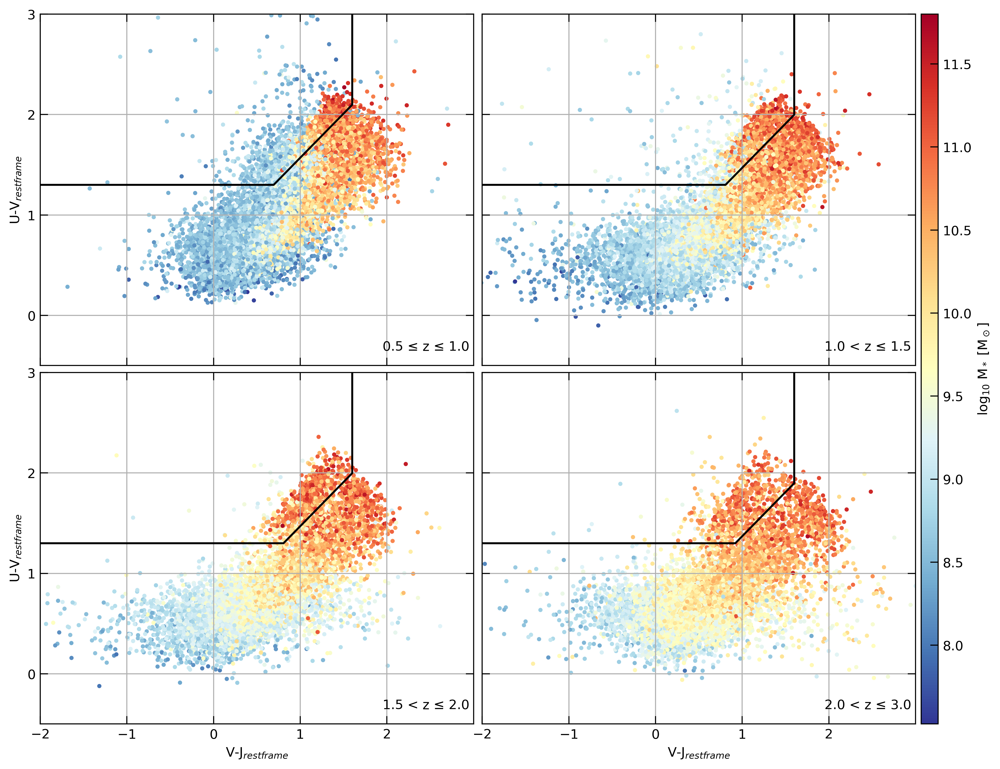

In [4]:
VJ = []
UV = []
M = []
cut_VJ = []
cut_UV = []
VJ.append(VJcol[(redshift<=1.0)])
VJ.append(VJcol[(redshift>1.0)&(redshift<=1.5)])
VJ.append(VJcol[(redshift>1.5)&(redshift<=2.0)])
VJ.append(VJcol[(redshift>2.0)])
UV.append(UVcol[(redshift>=0.5)&(redshift<=1.0)])
UV.append(UVcol[(redshift>1.0)&(redshift<=1.5)])
UV.append(UVcol[(redshift>1.5)&(redshift<=2.0)])
UV.append(UVcol[(redshift>2.0)])
M.append(lmass[(redshift>=0.5)&(redshift<=1.0)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)])
M.append(lmass[(redshift>2.0)])
cut_VJ.append([-10.,0.693182,1.6,1.6])
cut_VJ.append([-10.,0.806818,1.6,1.6])
cut_VJ.append([-10.,0.806818,1.6,1.6])
cut_VJ.append([-10.,0.920455,1.6,1.6])
cut_UV.append([1.3,1.3,2.098,5])
cut_UV.append([1.3,1.3,1.998,5])
cut_UV.append([1.3,1.3,1.998,5])
cut_UV.append([1.3,1.3,1.898,5])

min_c = min(lmass)
max_c = max(lmass)

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

for z in range(len(M)):
    sc = ax[x[z],y[z]].scatter(VJ[z],UV[z],s=5,c=M[z],cmap='RdYlBu_r',vmin=min_c,vmax=max_c)
    ax[x[z],y[z]].plot(cut_VJ[z],cut_UV[z],c="black")
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([0,1,2,3])
    else:
        ax[x[z],y[z]].set_xticks([-2,-1,0,1,2])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(-2,3)
    ax[x[z],y[z]].set_ylim(-0.5,3)
    ax[x[z],y[z]].text(1.95, -0.35,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('V-J$_{restframe}$')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('U-V$_{restframe}$')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()

cbar_ax = fig.add_axes([0.905, 0.125, 0.015, 0.755])
cbar = fig.colorbar(sc, cax=cbar_ax)

cbar
cbar.ax.set_ylabel('log$_{10}$ M$_*$ [M$_\odot$]')
cbar.ax.tick_params(direction='in', length=6)

plt.subplots_adjust(wspace=0.02, hspace=0.02)
plt.show()

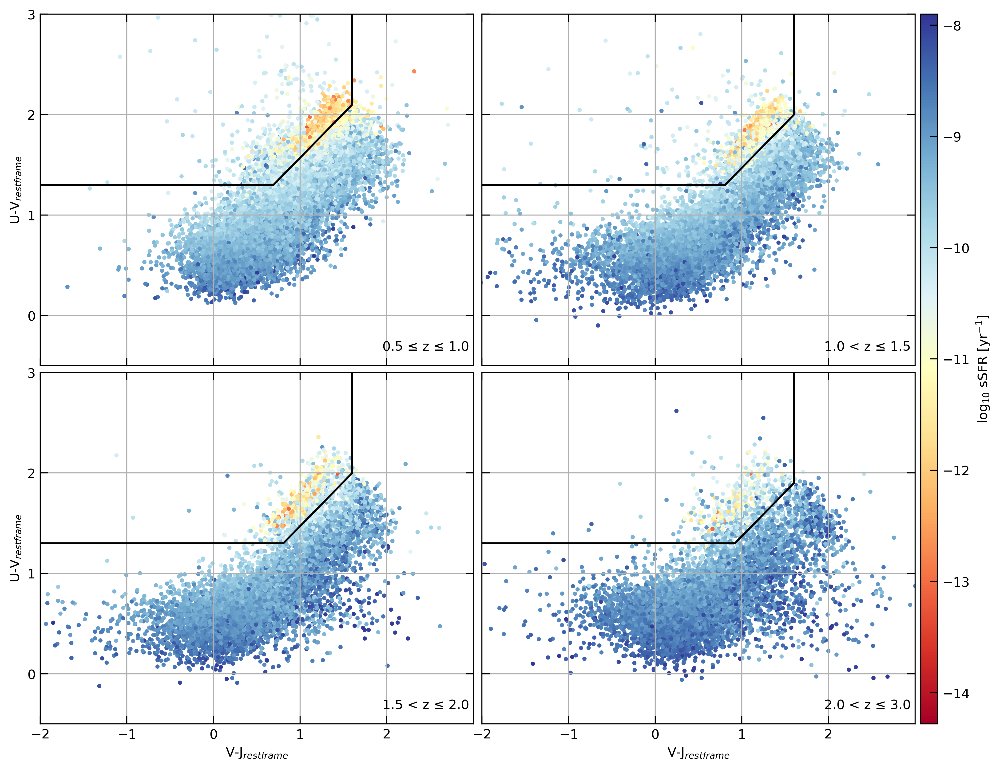

In [5]:
VJ = []
UV = []
M = []
cut_VJ = []
cut_UV = []

VJ.append(VJcol[(redshift<=1.0)])
VJ.append(VJcol[(redshift>1.0)&(redshift<=1.5)])
VJ.append(VJcol[(redshift>1.5)&(redshift<=2.0)])
VJ.append(VJcol[(redshift>2.0)])
UV.append(UVcol[(redshift>=0.5)&(redshift<=1.0)])
UV.append(UVcol[(redshift>1.0)&(redshift<=1.5)])
UV.append(UVcol[(redshift>1.5)&(redshift<=2.0)])
UV.append(UVcol[(redshift>2.0)])
M.append(lssfr[(redshift>=0.5)&(redshift<=1.0)])
M.append(lssfr[(redshift>1.0)&(redshift<=1.5)])
M.append(lssfr[(redshift>1.5)&(redshift<=2.0)])
M.append(lssfr[(redshift>2.0)])
cut_VJ.append([-10.,0.693182,1.6,1.6])
cut_VJ.append([-10.,0.806818,1.6,1.6])
cut_VJ.append([-10.,0.806818,1.6,1.6])
cut_VJ.append([-10.,0.920455,1.6,1.6])
cut_UV.append([1.3,1.3,2.098,5])
cut_UV.append([1.3,1.3,1.998,5])
cut_UV.append([1.3,1.3,1.998,5])
cut_UV.append([1.3,1.3,1.898,5])

min_c = min(lssfr)
max_c = max(lssfr)

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

for z in range(len(M)):
    sc = ax[x[z],y[z]].scatter(VJ[z],UV[z],s=5,c=M[z],cmap='RdYlBu',vmin=min_c,vmax=max_c)
    ax[x[z],y[z]].plot(cut_VJ[z],cut_UV[z],c="black")
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([0,1,2,3])
    else:
        ax[x[z],y[z]].set_xticks([-2,-1,0,1,2])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(-2,3)
    ax[x[z],y[z]].set_ylim(-0.5,3)
    ax[x[z],y[z]].text(1.95, -0.35,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('V-J$_{restframe}$')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('U-V$_{restframe}$')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()

cbar_ax = fig.add_axes([0.905, 0.125, 0.015, 0.755])
cbar = fig.colorbar(sc, cax=cbar_ax)

cbar
cbar.ax.set_ylabel('log$_{10}$ sSFR [yr$^{-1}$]')
cbar.ax.tick_params(direction='in', length=6)

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

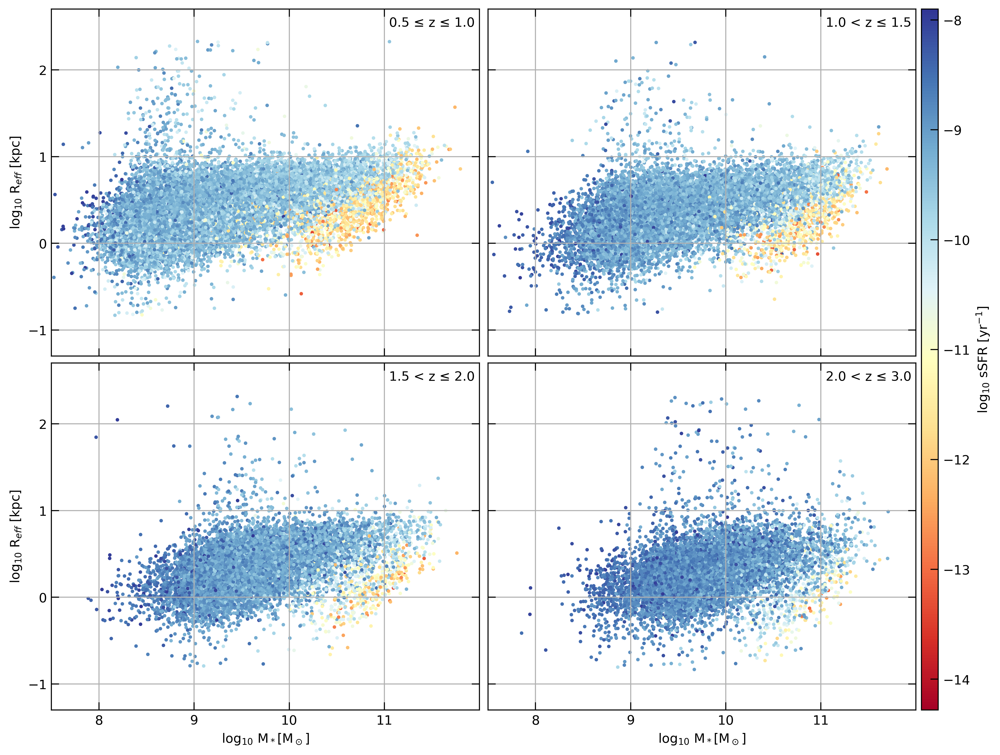

In [6]:
M = []
R = []
SF = []

M.append(lmass[(redshift>=0.5)&(redshift<=1.0)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)])
M.append(lmass[(redshift>2.0)])
R.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)])
R.append(lR_eff[(redshift>2.0)])
SF.append(lssfr[(redshift>=0.5)&(redshift<=1.0)])
SF.append(lssfr[(redshift>1.0)&(redshift<=1.5)])
SF.append(lssfr[(redshift>1.5)&(redshift<=2.0)])
SF.append(lssfr[(redshift>2.0)])
min_c = min(lssfr)
max_c = max(lssfr)

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

for z in range(len(M)):
    sc = ax[x[z],y[z]].scatter(M[z],R[z],s=3,c=SF[z],cmap='RdYlBu',vmin=min_c,vmax=max_c)
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([-1,0,1,2])
    else:
        ax[x[z],y[z]].set_xticks([8,9,10,11])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(7.5,12)
    ax[x[z],y[z]].set_ylim(-1.3,2.7)
    ax[x[z],y[z]].text(11.05, 2.5,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()

cbar_ax = fig.add_axes([0.905, 0.125, 0.015, 0.755])
cbar = fig.colorbar(sc, cax=cbar_ax)

cbar
cbar.ax.set_ylabel('log$_{10}$ sSFR [yr$^{-1}$]')
cbar.ax.tick_params(direction='in', length=6)

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

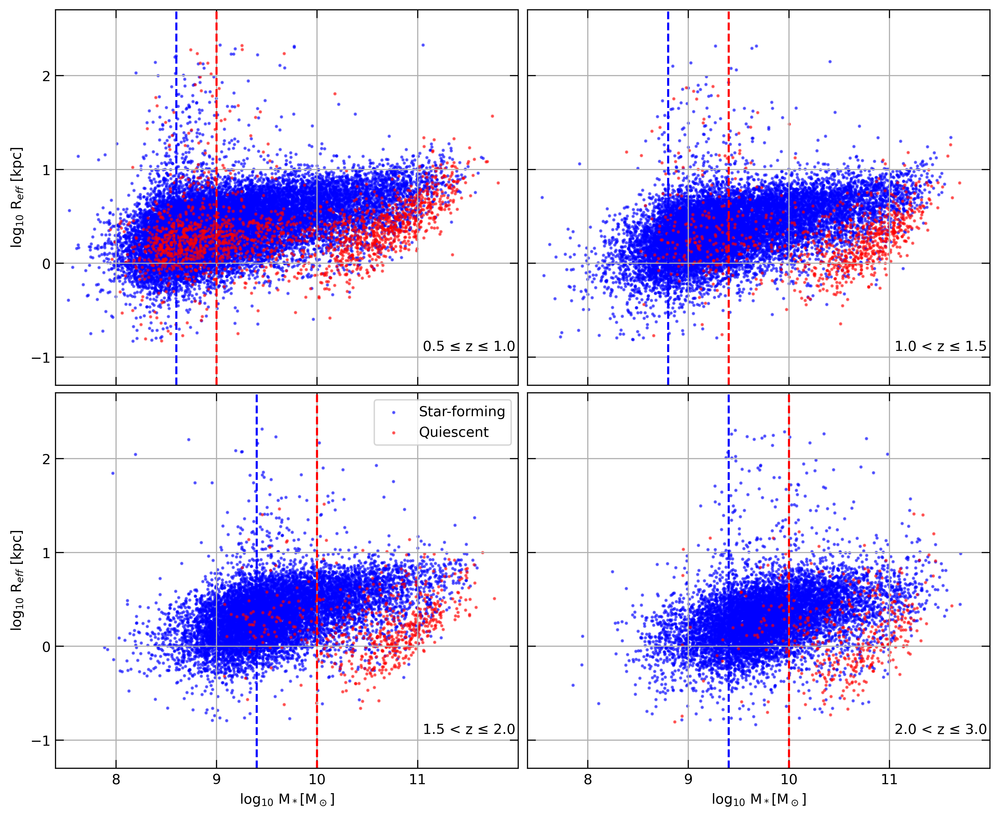

In [7]:
M_q = []
M_sf = []
R_q = []
R_sf = []

M_q.append(lmass[(redshift<=1.0)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>9.0)]
M_sf.append(lmass[(redshift<=1.0)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>8.6)]
M_q.append(lmass[(redshift>1.0)&(redshift<=1.5)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>9.4)]
M_sf.append(lmass[(redshift>1.0)&(redshift<=1.5)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>8.8)]
M_q.append(lmass[(redshift>1.5)&(redshift<=2.0)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>10.0)]
M_sf.append(lmass[(redshift>1.5)&(redshift<=2.0)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>9.4)]
M_q.append(lmass[(redshift>2.0)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>10.0)]
M_sf.append(lmass[(redshift>2.0)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>9.4)]
R_q.append(lR_eff[(redshift<=1.0)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>9.0)]
R_sf.append(lR_eff[(redshift<=1.0)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>8.6)]
R_q.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>9.4)]
R_sf.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>8.8)]
R_q.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>10.0)]
R_sf.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>9.4)]
R_q.append(lR_eff[(redshift>2)&(UVcol>1.3)&(VJcol<1.6)&(UVcol>(0.88*VJcol+0.69))])#&(lmass>10.0)]
R_sf.append(lR_eff[(redshift>2)&((UVcol<1.3)|(VJcol>1.6)|(UVcol<(0.88*VJcol+0.69)))])#&(lmass>9.4)]

min_c = min(lssfr)
max_c = max(lssfr)

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

for z in range(len(M)):
    sc = ax[x[z],y[z]].scatter(M_sf[z],R_sf[z],s=2,c='blue',alpha=0.5,label='Star-forming')
    ax[x[z],y[z]].scatter(M_q[z],R_q[z],s=2,c='red',alpha=0.5,label='Quiescent')
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([-1,0,1,2])
    else:
        ax[x[z],y[z]].set_xticks([8,9,10,11])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(7.4,12)
    ax[x[z],y[z]].set_ylim(-1.3,2.7)
    ax[x[z],y[z]].text(11.05, -0.93,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()
    if z == 2:
        ax[x[z],y[z]].legend()

linex = np.zeros(1000)
liney = np.linspace(-1.3,2.7,1000)
for i in range(len(linex)):
    linex[i] = 8.6
ax[0,0].plot(linex,liney,'--',c='blue')
for i in range(len(linex)):
    linex[i] = 9.0
ax[0,0].plot(linex,liney,'--',c='red')
for i in range(len(linex)):
    linex[i] = 8.8
ax[0,1].plot(linex,liney,'--',c='blue')
for i in range(len(linex)):
    linex[i] = 9.4
ax[0,1].plot(linex,liney,'--',c='red')
ax[1,0].plot(linex,liney,'--',c='blue')
for i in range(len(linex)):
    linex[i] = 10.0
ax[1,0].plot(linex,liney,'--',c='red')
for i in range(len(linex)):
    linex[i] = 9.4
ax[1,1].plot(linex,liney,'--',c='blue')
for i in range(len(linex)):
    linex[i] = 10.0
ax[1,1].plot(linex,liney,'--',c='red')

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

In [8]:
M = []
M_q = []
FAST = []
FAST_q = []
M_q_mag = []
R = []
R_q = []
R_q_FAST = []
R_q_FAST_err = []
R_q_mag = []


#data selection

#all prospector quiescent data (unused here)
M.append(lmass[(redshift<=1.0)&(quiescent)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
M.append(lmass[(redshift>2.0)&(quiescent)])

#quiescent prospector data over M=10.3 and brighter than 24.5 (unused here)
M_q.append(lmass[(redshift<=1.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
M_q.append(lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
M_q.append(lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
M_q.append(lmass[(redshift>2.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])

#all quiescent fast data (unused here)
FAST.append(FAST_lmass[(redshift<=1.0)&(quiescent)])
FAST.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
FAST.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
FAST.append(FAST_lmass[(redshift>2.0)&(quiescent)])

#quiescent fast data over M=10.3 following vdw (plotted in black)
FAST_q.append(FAST_lmass[(redshift<=1.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_q.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_q.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_q.append(FAST_lmass[(redshift>2.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

#all quiescent radius data (unused here)
R.append(lR_eff[(redshift<=1.0)&(quiescent)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
R.append(lR_eff[(redshift>2)&(quiescent)])

#quiescent radius data over M=10.3 and brighter than 24.5 (unused here)
R_q.append(lR_eff[(redshift<=1.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
R_q.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
R_q.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])
R_q.append(lR_eff[(redshift>2.0)&(quiescent)&(lmass>10.301)&(f160w_mag<24.5)])

#quiescent radius data over M=10.3 following vdw (plotted in black)
R_q_FAST.append(lR_eff[(redshift<=1.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_q_FAST.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_q_FAST.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_q_FAST.append(lR_eff[(redshift>2.0)&(quiescent)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

#error on radius data (used for fit weighting)
R_q_FAST_err.append(lR_eff_err[(redshift<=1.0)&(quiescent)&(FAST_lmass>10.301)])
R_q_FAST_err.append(lR_eff_err[(redshift>1.0)&(redshift<=1.5)&(quiescent)&(FAST_lmass>10.301)])
R_q_FAST_err.append(lR_eff_err[(redshift>1.5)&(redshift<=2.0)&(quiescent)&(FAST_lmass>10.301)])
R_q_FAST_err.append(lR_eff_err[(redshift>2.0)&(quiescent)&(FAST_lmass>10.301)])

print(len(FAST_q[0]),len(FAST_q[1]),len(FAST_q[2]),len(FAST_q[3]))

def power_law(M,A,a):
    return A+(a*M-a*np.log10(5e10))

def broken_power_law(lmass,A1,alpha1,alpha2,mp):
    mstar=(10**lmass)/5e10
    mpstar=(10**mp)/5e10
    A2=A1*mpstar**(alpha1-alpha2)
    out=np.zeros_like(lmass)
    out[lmass<=mp]=A1*mstar[lmass<=mp]**alpha1
    out[lmass>mp]=A2*mstar[lmass>mp]**alpha2
    return out

def quiescent_fit(xvals, yvals, error):   #curve fit calculation with upper fit and lower fit and comparison line
    fit_q.append(curve_fit(f=power_law, xdata=xvals, ydata=yvals, sigma=error, p0=x0, bounds=bounds))
    uperr_q.append(fit_q[z][0]+np.sqrt(np.diag(fit_q[z][1])))
    lowerr_q.append(fit_q[z][0]-np.sqrt(np.diag(fit_q[z][1])))
    R_q_fit.append(power_law(xvals,*fit_q[z][0]))
    R_q_comp.append(power_law(FAST_q[z],Acomp[z],acomp[z]))
    R_q_low.append(power_law(xvals,*lowerr_q[z]))
    R_q_high.append(power_law(xvals,*uperr_q[z]))

def sort_index(xvals, yvals, xvals, yvals):  #index sorting function so that mass and radius values correctly correspond to eachother
    sort = sorted(zip(xvals,yvals), key = operator.itemgetter(0))
    zipX,zipY = (zip(*sort))
    xvals = []
    yvals = []
    xvals.append(zipX)
    yvals.append(zipY)


#median calculation based on binsize and selection threshold
marray=np.arange(7,15,0.2)
M_medians = []
R_medians = []
R_medians_err = []

for z in range(len(M)):
    mass_med = []
    radius_med = []
    radius_med_err = []
    for m in marray:
        sel=(FAST_q[z]>m)&(FAST_q[z]<m+0.2)    #mass selection
        #print(z,sum(sel))
        if sum(sel)>=10:
            mass_med.append(np.median(FAST_q[z][sel]))  #adding mass medians for each selection
            radius_med.append(np.median(R_q_FAST[z][sel]))   #adding radius medians for each selection
    mass_med = [i for i in mass_med if np.isnan(i) == False]  #removing nan values from median array
    mass_med = np.asarray(mass_med,dtype=float)
    radius_med = [i for i in radius_med if np.isnan(i) == False]  #removing nan values from median array
    radius_med = np.asarray(radius_med,dtype=float)
    M_medians.append(mass_med)
    R_medians.append(radius_med)
M_medians = np.asarray(M_medians,dtype=object)
R_medians = np.asarray(R_medians,dtype=object)

x0 =[0.3,0.75] #inital values of fit
bounds = ([-10,-10],[10,10]) #bounds of fit


#arrays in which the outputs of the fitting code will be sent
fit_q = []
stdev_q = []
uperr_q = []
lowerr_q = []
R_q_fit = []
R_q_comp = []
M_q_srtd = []
R_q_srtd = []
FAST_q_srtd = []
R_q_comp_srtd = []
R_q_low = []
R_q_high = []
FAST_qlow_srtd = []
FAST_qhigh_srtd = []
R_q_low_srtd = []
R_q_high_srtd = []

Acomp = [0.42,0.22,0.09,-0.05]  #A parameter from vdW
acomp = [0.71,0.76,0.76,0.76]  #alpha prameters from vdW

#fitting data and sorting x and y columns so that each mass matches to it's correspoding radius value
for z in range(len(M)):
    #quiescent_fit(M_medians[z], R_medians[z])   #median weighted fit
    quiescent_fit(FAST_q[z], R_q_FAST[z], R_q_FAST_err[z])  #error weighted fit
    #sort_index(FAST_q[z], R_q_fit[z], M_q_srtd, R_q_srtd)
    sort_index(FAST_q[z], R_q_comp[z], FAST_q_srtd, R_q_comp_srtd)
    sort_index(FAST_q[z], R_q_low[z], FAST_qlow_srtd, R_q_low_srtd)
    sort_index(FAST_q[z], R_q_high[z], FAST_qhigh_srtd, R_q_high_srtd)

#converting data to np array to make manipulation easier
M_q_srtd = np.asarray(M_q_srtd,dtype=object)
R_q_srtd = np.asarray(R_q_srtd,dtype=object)
FAST_q_srtd = np.asarray(FAST_q_srtd,dtype=object)
R_q_comp_srtd = np.asarray(R_q_comp_srtd,dtype=object)
FAST_qlow_srtd = np.asarray(FAST_qlow_srtd,dtype=object)
R_q_low_srtd = np.asarray(R_q_low_srtd,dtype=object)
FAST_qhigh_srtd = np.asarray(FAST_qhigh_srtd,dtype=object)
R_q_high_srtd = np.asarray(R_q_high_srtd,dtype=object)

#plotting data
x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

for z in range(len(M)):
    #ax[x[z],y[z]].scatter(M_q[z],R_q[z],s=2,c='grey',label='Prospector Masses')
    ax[x[z],y[z]].scatter(M_medians[z],R_medians[z],s=20,c='cyan', label='Medians')
    ax[x[z],y[z]].scatter(FAST_q[z],R_q_FAST[z],s=2,c='black',label='FAST Masses')
    ax[x[z],y[z]].plot(FAST_q[z],R_q_fit[z],c='blue',label='Error Weighted Fit')
    ax[x[z],y[z]].plot(FAST_q[z],R_q_comp[z],'',c='red',label='van der Wel et. al (2014)')
    #ax[x[z],y[z]].plot(FAST_qlow_srtd[z],R_q_low_srtd[z],'g--')
    #ax[x[z],y[z]].plot(FAST_qhigh_srtd[z],R_q_high_srtd[z],'g--')
    #ax[x[z],y[z]].fill_between(M_q_srtd[z],R_q_low_srtd[z],R_q_high_srtd[z],color='blue',alpha=0.1)
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([-1,0,1,2])
    else:
        ax[x[z],y[z]].set_xticks([8,9,10,11])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(10,12)
    ax[x[z],y[z]].set_ylim(-1.3,2)
    ax[x[z],y[z]].text(11.05,-0.93,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()
    if z == 3:
        ax[x[z],y[z]].legend()

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

493 461 399 281


SyntaxError: duplicate argument 'xvals' in function definition (838079714.py, line 86)

In [ ]:
M = []
M_sf = []
FAST = []
FAST_sf = []
M_sf_mag = []
R = []
R_sf = []
R_sf_FAST = []
R_sf_FAST_err = []
R_sf_mag = []


#data selection

#all prospector starforming data (unused here)
M.append(lmass[(redshift<=1.0)&(starforming)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
M.append(lmass[(redshift>2.0)&(starforming)])

#starforming prospector data over M=10.3 and brighter than 24.5 (unused here)
M_sf.append(lmass[(redshift<=1.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])

#all starforming fast data (unused here)
FAST.append(FAST_lmass[(redshift<=1.0)&(starforming)])
FAST.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
FAST.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
FAST.append(FAST_lmass[(redshift>2.0)&(starforming)])

#starforming fast data over M=10.3 following vdw (plotted in black)
FAST_sf.append(FAST_lmass[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

#all starforming radius data (unused here)
R.append(lR_eff[(redshift<=1.0)&(starforming)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)])
R.append(lR_eff[(redshift>2)&(starforming)])

#starforming radius data over M=10.3 and brighter than 24.5 (unused here)
R_sf.append(lR_eff[(redshift<=1.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])

#starforming radius data over M=10.3 following vdw (plotted in black)
R_sf_FAST.append(lR_eff[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

#error on radius data (used for fit weighting)
R_sf_FAST_err.append(lR_eff_err[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])

print(len(FAST_sf[0]),len(FAST_sf[1]),len(FAST_sf[2]),len(FAST_sf[3]))

def power_law(M,A,a):
    return A+(a*M-a*np.log10(5e10))

def broken_power_law(lmass,A1,alpha1,alpha2,mp):
    mstar=(10**lmass)/5e10
    mpstar=(10**mp)/5e10
    A2=A1*mpstar**(alpha1-alpha2)
    out=np.zeros_like(lmass)
    out[lmass<=mp]=A1*mstar[lmass<=mp]**alpha1
    out[lmass>mp]=A2*mstar[lmass>mp]**alpha2
    return out

def starforming_fit(xvals, yvals, error):   #curve fit calculation with upper fit and lower fit and comparison line
    fit_sf.append(curve_fit(f=power_law, xdata=xvals, ydata=yvals, sigma=error, p0=x0, bounds=bounds))
    uperr_sf.append(fit_sf[z][0]+np.sqrt(np.diag(fit_sf[z][1])))
    lowerr_sf.append(fit_sf[z][0]-np.sqrt(np.diag(fit_sf[z][1])))
    R_sf_fit.append(power_law(xvals,*fit_sf[z][0]))
    R_sf_comp.append(power_law(FAST_sf[z],Acomp[z],acomp[z]))
    R_sf_low.append(power_law(xvals,*lowerr_sf[z]))
    R_sf_high.append(power_law(xvals,*uperr_sf[z]))


#median calculation based on binsize and selection threshold
marray=np.arange(7,15,0.2)
M_medians = []
R_medians = []
R_medians_err = []

for z in range(len(M)):
    mass_med = []
    radius_med = []
    radius_med_err = []
    for m in marray:
        sel=(FAST_sf[z]>m)&(FAST_sf[z]<m+0.2)    #mass selection
        #print(z,sum(sel))
        if sum(sel)>=10:
            mass_med.append(np.median(FAST_sf[z][sel]))  #adding mass medians for each selection
            radius_med.append(np.median(R_sf_FAST[z][sel]))   #adding radius medians for each selection
    mass_med = [i for i in mass_med if np.isnan(i) == False]  #removing nan values from median array
    mass_med = np.asarray(mass_med,dtype=float)
    radius_med = [i for i in radius_med if np.isnan(i) == False]  #removing nan values from median array
    radius_med = np.asarray(radius_med,dtype=float)
    M_medians.append(mass_med)
    R_medians.append(radius_med)
M_medians = np.asarray(M_medians,dtype=object)
R_medians = np.asarray(R_medians,dtype=object)

x0 =[0.3,0.75] #inital values of fit
bounds = ([-10,-10],[10,10]) #bounds of fit


#arrays in which the outputs of the fitting code will be sent
fit_sf = []
stdev_sf = []
uperr_sf = []
lowerr_sf = []
R_sf_fit = []
R_sf_comp = []
R_sf_low = []
R_sf_high = []

Acomp = [0.78,0.70,0.65,0.55]  #A parameter from vdW
acomp = [0.22,0.22,0.23,0.22]  #alpha prameters from vdW

#fitting data and sorting x and y columns so that each mass matches to it's correspoding radius value
for z in range(len(M)):
    #starforming_fit(M_medians[z], R_medians[z])   #median weighted fit
    starforming_fit(FAST_sf[z], R_sf_FAST[z], None)  #error weighted fit

#plotting data
x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

for z in range(len(M)):
    #ax[x[z],y[z]].scatter(M_sf[z],R_sf[z],s=2,c='grey',label='Prospector Masses')
    ax[x[z],y[z]].scatter(M_medians[z],R_medians[z],s=20,c='cyan', label='Medians')
    ax[x[z],y[z]].scatter(FAST_sf[z],R_sf_FAST[z],s=2,c='black',label='FAST Masses')
    ax[x[z],y[z]].plot(FAST_sf[z],R_sf_fit[z],c='blue',label='Error Weighted Fit')
    ax[x[z],y[z]].plot(FAST_sf[z],R_sf_comp[z],'',c='red',label='van der Wel et. al (2014)')
    #ax[x[z],y[z]].plot(FAST_sf[z],R_sf_low[z],'g--')
    #ax[x[z],y[z]].plot(FAST_sf[z],R_sf_high[z],'g--')
    ax[x[z],y[z]].fill_between(FAST_sf[z],R_sf_low[z],R_sf_high[z],color='blue',alpha=0.1)
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([-1,0,1,2])
    else:
        ax[x[z],y[z]].set_xticks([8,9,10,11])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(10,12)
    ax[x[z],y[z]].set_ylim(-1.3,2)
    ax[x[z],y[z]].text(11.05,-0.93,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()
    if z == 3:
        ax[x[z],y[z]].legend()

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

In [9]:
M = []
FAST = []
R = []
MDelta = []
RDelta = []

M_sf = []
M_q = []
R_sf = []
R_q = []
mag_sf = []
mag_q = []

M.append(lmass[(redshift>=0.5)&(redshift<=1.0)])#&(f160w_mag<24.5)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)])#&(f160w_mag<24.5)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)])#&(f160w_mag<24.5)])
M.append(lmass[(redshift>2.0)])#&(f160w_mag<24.5)])

FAST.append(FAST_lmass[(redshift>=0.5)&(redshift<=1.0)])#&(f160w_mag<24.5)])
FAST.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)])#&(f160w_mag<24.5)])
FAST.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)])#&(f160w_mag<24.5)])
FAST.append(FAST_lmass[(redshift>2.0)])#&(f160w_mag<24.5)])

R.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)])#&(f160w_mag<24.5)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)])#&(f160w_mag<24.5)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)])#&(f160w_mag<24.5)])
R.append(lR_eff[(redshift>2)])#&(f160w_mag<24.5)])

M_sf.append(lmass[(redshift>=0.5)&(redshift<=1.0)&(starforming)])
M_sf.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
M_sf.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
M_sf.append(lmass[(redshift>2.0)&(starforming)])

M_q.append(lmass[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
M_q.append(lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
M_q.append(lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
M_q.append(lmass[(redshift>2.0)&(quiescent)])

R_q.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
R_q.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
R_q.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
R_q.append(lR_eff[(redshift>2)&(quiescent)])

mag_sf.append(f160w_mag[(redshift>=0.5)&(redshift<=1.0)&(starforming)])
mag_sf.append(f160w_mag[(redshift>1.0)&(redshift<=1.5)&(starforming)])
mag_sf.append(f160w_mag[(redshift>1.5)&(redshift<=2.0)&(starforming)])
mag_sf.append(f160w_mag[(redshift>2.0)&(starforming)])

mag_q.append(f160w_mag[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
mag_q.append(f160w_mag[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
mag_q.append(f160w_mag[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
mag_q.append(f160w_mag[(redshift>2.0)&(quiescent)])

marray=np.arange(7,13,0.2)
rarray=np.arange(-1,3,0.2)
M_medians = []
R_medians = []
RFAST_medians = []
FAST_medians = []


for z in range(len(M)):
    mass_med = []
    fast_med = []
    radius_med = []
    for m in marray:
        for r in rarray:
            sel=(FAST[z]>=m)&(FAST[z]<m+0.2)&(R[z]>=r)&(R[z]<r+0.2)
            if sum(sel)>=10:
                box_masses = M[z][sel]
                box_fast = FAST[z][sel]
                box_radii = R[z][sel]
                #print(list(zip(box_masses, box_radii)))
                mass_med.append(np.median(box_masses))
                fast_med.append(np.median(box_fast))
                radius_med.append(np.median(box_radii))
    mass_med = [i for i in mass_med if np.isnan(i) == False]
    mass_med = np.asarray(mass_med,dtype=object)
    fast_med = [i for i in fast_med if np.isnan(i) == False]
    fast_med = np.asarray(fast_med,dtype=object)
    radius_med = [i for i in radius_med if np.isnan(i) == False]
    radius_med = np.asarray(radius_med,dtype=object)
    M_medians.append(mass_med)
    FAST_medians.append(fast_med)
    R_medians.append(radius_med)

Med_Delta = np.array(M_medians,dtype=object)-np.array(FAST_medians,dtype=object)
RMed_Delta = np.array(R_medians,dtype=object)-np.array(R_medians,dtype=object)
Med_Delta = [a.astype(np.float64) for a in Med_Delta]
RMed_Delta = [a.astype(np.float64) for a in RMed_Delta]
FAST_medians = [a.astype(np.float64) for a in FAST_medians]
R_medians = [a.astype(np.float64) for a in R_medians]
#print(Med_Delta)

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = mpl.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap
         
carray=np.arange(7,15,0.25)
mass_sf = [[],[],[],[]]
mass_q = [[],[],[],[]]
frac_sf = [[],[],[],[]]
frac_q = [[],[],[],[]]
for i in range(len(M_sf)):
    for c in marray:
        sel=(M_sf[i]>c)&(M_sf[i]<c+0.25)
        if sum(sel)!= 0:
            mass_sf[i].append(c+0.25)
            frac_sf[i].append(len(M_sf[i][(sel)&(mag_sf[i]<24.5)])/len(M_sf[i][sel]))
for i in range(len(M_q)):
    for c in carray:
        sel=(M_q[i]>c)&(M_q[i]<c+0.25)
        if sum(sel)!= 0:
            mass_q[i].append(c+0.25)
            frac_q[i].append(len(M_q[i][(sel)&(mag_q[i]<24.5)])/len(M_q[i][sel]))

NameError: name 'R_q_fit' is not defined

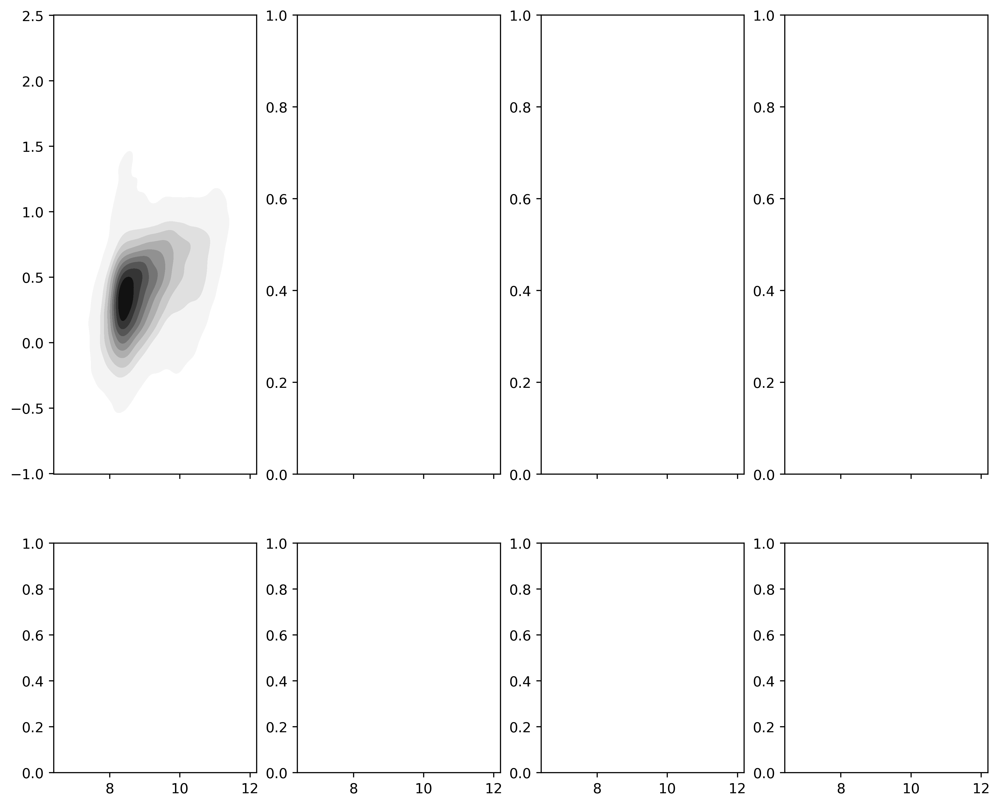

In [10]:
fig, ax = plt.subplots(2, 4, sharex=True, gridspec_kw={'height_ratios': [2, 1]})

x = [0,0,0,0]
x2 = [1,1,1,1]
y = [0,1,2,3]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']


map1 = plt.cm.Reds_r(np.linspace(0., 1, 128))
map2 = plt.get_cmap(name='cma:laguna_r')(np.linspace(0, 1, 128))

# combine them and build a new colormap
comb_map = np.vstack((map1, map2))
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', comb_map)
cmap = shiftedColorMap(mymap, midpoint=0.17)
#cmap = 'cma:unph'
cNorm  = colors.Normalize(vmin=min(min(x) for x in Med_Delta), vmax=max(max(x) for x in Med_Delta))
scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

#levels=[.1,.2,.3,.4,.6,.7,.8,.9,1]

for z in range(len(M)):
    sbrn.kdeplot(x=FAST[z], y=R[z], shade=True, cmap='binary', ax=ax[x[z],y[z]], thresh=0.02)#, levels=levels)
    ax[x[z],y[z]].plot(FAST_q[z],R_q_fit[z],':',c='black',label='Quiescent fit')
    ax[x[z],y[z]].plot(FAST_sf[z],R_sf_fit[z],c='black',label='Star-Forming fit')
    #colorVal = scalarMap.to_rgba(Med_Delta[z])
    ax[x[z],y[z]].quiver(FAST_medians[z], R_medians[z], Med_Delta[z], RMed_Delta[z], Med_Delta[z], cmap=cmap)
    #for i in range(len(FAST_medians[z])):
    #    ax[x[z],y[z]].arrow(FAST_medians[z][i],R_medians[z][i],Med_Delta[z][i],RMed_Delta[z][i], 
    #                    width=0.007,head_width=0.055, length_includes_head=True, color=colorVal[i])
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in', length=2)
    ax[x[z],y[z]].set_yticks([0,1,2])
    ax[x[z],y[z]].set_xticks([8,9,10,11])
    if z > 0:
        ax[x[z],y[z]].set_yticklabels([])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(7,12)
    ax[x[z],y[z]].set_ylim(-1,2)
    #ax[x[z],y[z]].set_yscale('log')
    ax[x[z],y[z]].text(10.1,-0.9,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.5)
    #ax[x[z],y[z]].grid()
    if z == 0:
        ax[x[z],y[z]].legend(fontsize='x-small', loc='upper left')

for z in range(4):
    ax[x2[z],y[z]].plot(mass_sf[z],frac_sf[z],c='blue',label='Star-Forming')
    ax[x2[z],y[z]].plot(mass_q[z],frac_q[z],c='red',label='Quiescent')
    ax[x2[z],y[z]].set_ylim(0,1.05)
    if z > 0:
        ax[x2[z],y[z]].set_yticklabels([])
    ax[x2[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x2[z],y[z]].tick_params(which='minor', direction='in')
    ax[x2[z],y[z]].xaxis.set_ticks_position('both')
    ax[x2[z],y[z]].yaxis.set_ticks_position('both')
    ax[x2[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0:
        ax[x2[z],y[z]].set_ylabel('% Complete')
    ax[x2[z],y[z]].grid(True,'minor',alpha=0.1)
    if z == 0:
        ax[x2[z],y[z]].legend(fontsize='x-small', loc='upper left')
    
    
cbar_ax = fig.add_axes([0.905, 0.380, 0.010, 0.500])
#cbar_ax = fig.add_axes([0.905, 0.125, 0.015, 0.755])
#cbar = fig.colorbar(sc, cax=cbar_ax)

#cbar
#cbar.ax.set_ylabel('log$_{10}$ sSFR [yr$^{-1}$]')
#cbar.ax.tick_params(direction='in', length=6)

cb1 = mpl.colorbar.ColorbarBase(cbar_ax, cmap=cmap, norm=cNorm, orientation='vertical')
cb1.ax.set_ylabel('$\Delta$ log$_{10}$ M$_*$[M$_\odot$]')
cb1.ax.tick_params(direction='in', length=6)

plt.gcf().set_size_inches(16, 4)
plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

In [ ]:
#Delta = np.array(M,dtype=object) - np.array(FAST,dtype=object)
R = []
R_Error= []
M = []

M.append(lmass[(redshift>=0.5)&(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])
M.append(lmass[(redshift>2)&(starforming)&(FAST_lmass>10.301)])

R.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])
R.append(lR_eff[(redshift>2)&(starforming)&(FAST_lmass>10.301)])

R_Error.append(lR_eff_err[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])
R_Error.append(lR_eff_err[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])
R_Error.append(lR_eff_err[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])
R_Error.append(lR_eff_err[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])


Frac = np.array(R_Error)/np.array(R)

print(np.where(np.isclose(Frac[0], 0.00000091871733)))

#print(Frac[0])
#print(np.log10(Frac[0]))
print((R[0][4]), (R_Error[0][4]), (Frac[0][4]))

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

for z in range(len(R)):
    sc = ax[x[z],y[z]].scatter(R[z],np.log10(Frac[z]),s=3, c=M[z], cmap='cma:lacerta')
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log Radius')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log (Radius Error/Radius)')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()
    #if z == 3:
    #    ax[x[z],y[z]].legend()

plt.subplots_adjust(wspace=0.02, hspace=0.02)

cbar_ax = fig.add_axes([0.9105, 0.125, 0.015, 0.755])
cbar = fig.colorbar(sc, cax=cbar_ax)

cbar
cbar.ax.set_ylabel('log$_{10}$ M$_*$ [M$_\odot$]')
cbar.ax.tick_params(direction='in', length=6)

plt.gcf().set_size_inches(12, 10)

plt.show()

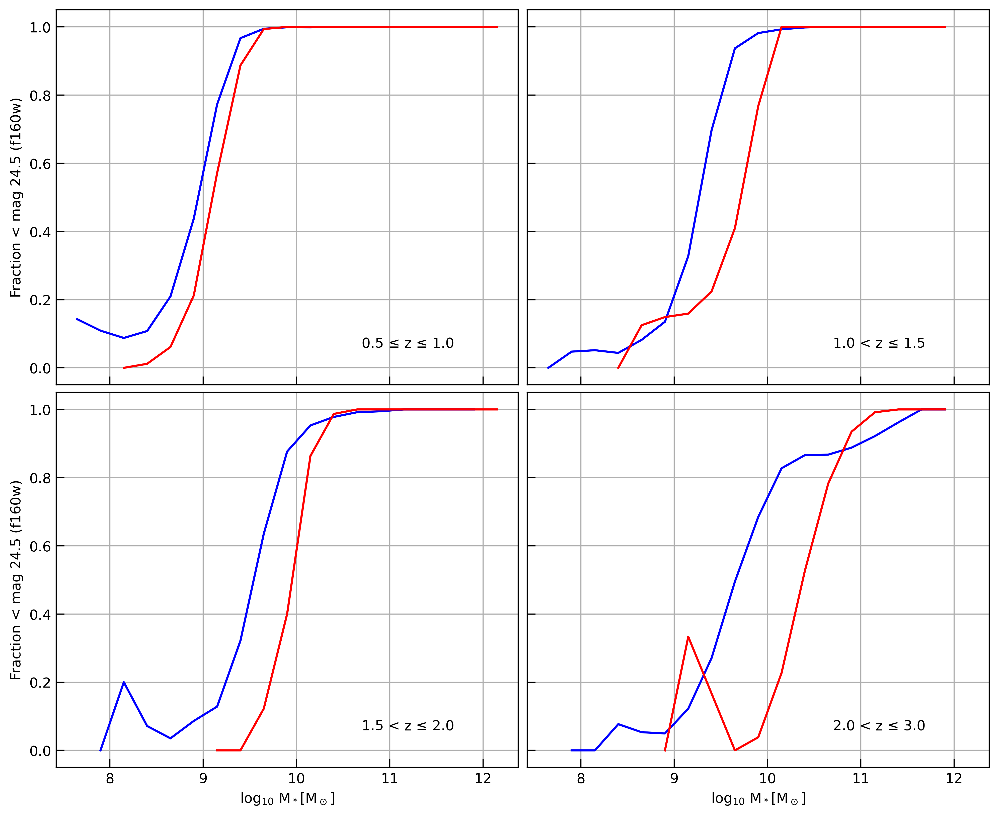

In [17]:
M_sf = []
M_q = []
R_sf = []
R_q = []
mag_sf = []
mag_q = []
M_sf.append(lmass[(redshift>=0.5)&(redshift<=1.0)&(starforming)])
M_sf.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
M_sf.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
M_sf.append(lmass[(redshift>2.0)&(starforming)])
M_q.append(lmass[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
M_q.append(lmass[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
M_q.append(lmass[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
M_q.append(lmass[(redshift>2.0)&(quiescent)])
R.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)])
R.append(lR_eff[(redshift>2)])
R_q.append(lR_eff[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
R_q.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
R_q.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
R_q.append(lR_eff[(redshift>2)&(quiescent)])
mag_sf.append(f160w_mag[(redshift>=0.5)&(redshift<=1.0)&(starforming)])
mag_sf.append(f160w_mag[(redshift>1.0)&(redshift<=1.5)&(starforming)])
mag_sf.append(f160w_mag[(redshift>1.5)&(redshift<=2.0)&(starforming)])
mag_sf.append(f160w_mag[(redshift>2.0)&(starforming)])
mag_q.append(f160w_mag[(redshift>=0.5)&(redshift<=1.0)&(quiescent)])
mag_q.append(f160w_mag[(redshift>1.0)&(redshift<=1.5)&(quiescent)])
mag_q.append(f160w_mag[(redshift>1.5)&(redshift<=2.0)&(quiescent)])
mag_q.append(f160w_mag[(redshift>2.0)&(quiescent)])

marray=np.arange(7,15,0.25)
mass_sf = [[],[],[],[]]
mass_q = [[],[],[],[]]
frac_sf = [[],[],[],[]]
frac_q = [[],[],[],[]]
for i in range(len(M_sf)):
    for m in marray:
        sel=(M_sf[i]>m)&(M_sf[i]<m+0.4)
        if sum(sel)!= 0:
            mass_sf[i].append(m+0.4)
            frac_sf[i].append(len(M_sf[i][(sel)&(mag_sf[i]<24.5)])/len(M_sf[i][sel]))
for i in range(len(M_q)):
    for m in marray:
        sel=(M_q[i]>m)&(M_q[i]<m+0.4)
        if sum(sel)!= 0:
            mass_q[i].append(m+0.4)
            frac_q[i].append(len(M_q[i][(sel)&(mag_q[i]<24.5)])/len(M_q[i][sel]))
#print(mass_sf[0],mass_q[0])

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

ax[0,0].plot(mass_sf[0],frac_sf[0],c='blue')
ax[0,1].plot(mass_sf[1],frac_sf[1],c='blue')
ax[1,0].plot(mass_sf[2],frac_sf[2],c='blue')
ax[1,1].plot(mass_sf[3],frac_sf[3],c='blue')

ax[0,0].plot(mass_q[0],frac_q[0],c='red')
ax[0,1].plot(mass_q[1],frac_q[1],c='red')
ax[1,0].plot(mass_q[2],frac_q[2],c='red')
ax[1,1].plot(mass_q[3],frac_q[3],c='red')

ax[0,0].tick_params(which='major', direction='in', length=6)
ax[0,0].tick_params(which='minor', direction='in')
ax[1,0].tick_params(which='major', direction='in', length=6)
ax[1,0].tick_params(which='minor', direction='in')
ax[0,1].tick_params(which='major', direction='in', length=6)
ax[0,1].tick_params(which='minor', direction='in')
ax[1,1].tick_params(which='major', direction='in', length=6)
ax[1,1].tick_params(which='minor', direction='in')

#ax[0,0].set_yticks([-1, 0, 1, 2])
#ax[0,1].set_xticks([8,9,10,11])
#ax[0,1].set_yticks([-1, 0, 1, 2])
#ax[1,1].set_xticks([8,9,10,11])

#ax[0,0].xaxis.set_ticks_position('both')
#ax[0,0].yaxis.set_ticks_position('both')
#ax[1,0].xaxis.set_ticks_position('both')
#ax[1,0].yaxis.set_ticks_position('both')
#ax[0,1].xaxis.set_ticks_position('both')
#ax[0,1].yaxis.set_ticks_position('both')
#ax[1,1].xaxis.set_ticks_position('both')
#ax[1,1].yaxis.set_ticks_position('both')

#ax[0,0].set_xlim(7.5,12)
#ax[0,1].set_xlim(7.5,12)
#ax[1,0].set_xlim(7.5,12)
#ax[1,1].set_xlim(7.5,12)

#ax[0,0].set_ylim(-1.3,2.7)
#ax[0,1].set_ylim(-1.3,2.7)
#ax[1,0].set_ylim(-1.3,2.7)
#ax[1,1].set_ylim(-1.3,2.7)

ax[0,0].text(10.7,0.06,'0.5 ≤ z ≤ 1.0')
ax[0,1].text(10.7,0.06,'1.0 < z ≤ 1.5')
ax[1,0].text(10.7,0.06,'1.5 < z ≤ 2.0')
ax[1,1].text(10.7,0.06,'2.0 < z ≤ 3.0')

ax[1,0].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
ax[1,1].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')

ax[0,0].set_ylabel('Fraction < mag 24.5 (f160w)')
ax[1,0].set_ylabel('Fraction < mag 24.5 (f160w)')

ax[0,0].grid(True,'minor',alpha=0.1)
ax[0,1].grid(True,'minor',alpha=0.1)
ax[1,0].grid(True,'minor',alpha=0.1)
ax[1,1].grid(True,'minor',alpha=0.1)
ax[0,0].grid()
ax[0,1].grid()
ax[1,0].grid()
ax[1,1].grid()

#ax[0,0].legend()
#ax[0,1].legend()
#ax[1,0].legend()
#ax[1,1].legend()

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()

In [ ]:
M = []
M_sf = []
FAST = []
FAST_sf = []
M_sf_mag = []
R = []
R_sf = []
R_sf_FAST = []
R_sf_FAST_err = []
R_sf_mag = []

M.append(lmass[(redshift<=1.0)&(starforming)])
M.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
M.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
M.append(lmass[(redshift>2.0)&(starforming)])

M_sf.append(lmass[(redshift<=1.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
M_sf.append(lmass[(redshift>2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])

FAST.append(FAST_lmass[(redshift<=1.0)&(starforming)])
FAST.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)])
FAST.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)])
FAST.append(FAST_lmass[(redshift>2.0)&(starforming)])

FAST_sf.append(FAST_lmass[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
FAST_sf.append(FAST_lmass[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

M_sf_mag.append(lmass[(redshift<=1.0)&(starforming)&(lmass>9.0)])#&(f160w_mag>24.5)])
M_sf_mag.append(lmass[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>9.4)])#&(f160w_mag>24.5)])
M_sf_mag.append(lmass[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.0)])#&(f160w_mag>24.5)])
M_sf_mag.append(lmass[(redshift>2.0)&(starforming)&(lmass>10.0)])#&(f160w_mag>24.5)])

R.append(lR_eff[(redshift<=1.0)&(starforming)])
R.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)])
R.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)])
R.append(lR_eff[(redshift>2)&(starforming)])

R_sf.append(lR_eff[(redshift<=1.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])
R_sf.append(lR_eff[(redshift>2.0)&(starforming)&(lmass>10.301)&(f160w_mag<24.5)])

R_sf_FAST.append(lR_eff[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])
R_sf_FAST.append(lR_eff[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])#&(f160w_mag<24.5)])

R_sf_FAST_err.append(lR_eff_err[(redshift<=1.0)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>1.0)&(redshift<=1.5)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>1.5)&(redshift<=2.0)&(starforming)&(FAST_lmass>10.301)])
R_sf_FAST_err.append(lR_eff_err[(redshift>2.0)&(starforming)&(FAST_lmass>10.301)])

R_sf_mag.append(lR_eff[(redshift<=1.0)&(starforming)&(lmass>9.0)])#&(f160w_mag>24.5)])
R_sf_mag.append(lR_eff[(redshift>1.0)&(redshift<=1.5)&(starforming)&(lmass>9.4)])#&(f160w_mag>24.5)])
R_sf_mag.append(lR_eff[(redshift>1.5)&(redshift<=2.0)&(starforming)&(lmass>10.0)])#&(f160w_mag>24.5)])
R_sf_mag.append(lR_eff[(redshift>2.0)&(starforming)&(lmass>10.0)])#&(f160w_mag>24.5)])

print(len(FAST_sf[0]),len(FAST_sf[1]),len(FAST_sf[2]),len(FAST_sf[3]))

def power_law(M,A,a):
    return A+(a*M-a*np.log10(5e10))

def broken_power_law(lmass,A1,alpha1,alpha2,mp):
    mstar=(10**lmass)/5e10
    mpstar=(10**mp)/5e10
    A2=A1*mpstar**(alpha1-alpha2)
    out=np.zeros_like(lmass)
    out[lmass<=mp]=A1*mstar[lmass<=mp]**alpha1
    out[lmass>mp]=A2*mstar[lmass>mp]**alpha2
    return out

def starforming_fit(xvals, yvals, error):  
    fit_sf.append(curve_fit(f=power_law, xdata=xvals, ydata=yvals, p0=x0, sigma=error, bounds=bounds))
    uperr_sf.append(fit_sf[z][0]+np.sqrt(np.diag(fit_sf[z][1])))
    lowerr_sf.append(fit_sf[z][0]-np.sqrt(np.diag(fit_sf[z][1])))
    R_sf_fit.append(power_law(xvals,*fit_sf[z][0]))
    R_sf_comp.append(power_law(FAST_sf[z],Acomp[z],acomp[z]))
    R_sf_low.append(power_law(xvals,*lowerr_sf[z]))
    R_sf_high.append(power_law(xvals,*uperr_sf[z]))

def sort_index(xvals, yvals, srtd_xvals, srtd_yvals):
    sort = sorted(zip(xvals,yvals), key = operator.itemgetter(0))
    zipX,zipY = (zip(*sort))
    srtd_xvals.append(zipX)
    srtd_yvals.append(zipY)

marray=np.arange(7,15,0.1)
M_medians = []
R_medians = []
R_medians_err = []

for z in range(len(M)):
    mass_med = []
    radius_med = []
    radius_med_err = []
    for m in marray:
        sel=(FAST_sf[z]>m)&(FAST_sf[z]<m+0.1)
        #print(z,sum(sel))
        if sum(sel)>5:
            mass_med.append(np.nanmedian(FAST_sf[z][sel]))
            radius_med.append(np.nanmedian(R_sf_FAST[z][sel]))
            #radius_med.append(np.nanmean(R_sf_FAST[z][sel]))
            #radius_med.append(np.average(R_sf_FAST[z][sel], weights=R_sf_FAST_err[z][sel]))
            radius_med_err.append(R_sf_FAST_err[z][np.argsort(radius_med)[len(radius_med)//2]])
            #print(radius_med[-1],',',radius_med_err[-1])
    mass_med = [i for i in mass_med if np.isnan(i) == False]
    mass_med = np.asarray(mass_med,dtype=float)
    radius_med = [i for i in radius_med if np.isnan(i) == False]
    radius_med = np.asarray(radius_med,dtype=float)
    radius_med_err = [i for i in radius_med_err if np.isnan(i) == False]
    radius_med_err = np.asarray(radius_med_err,dtype=float)
    M_medians.append(mass_med)
    R_medians.append(radius_med)
    R_medians_err.append(radius_med_err)
M_medians = np.asarray(M_medians,dtype=object)
R_medians = np.asarray(R_medians,dtype=object)
R_medians_err = np.asarray(R_medians_err,dtype=object)
#print(R_medians,R_medians_err)

x0 =[0.3,0.75]
bounds = ([-10,-10],[10,10])

fit_sf = []
stdev_sf = []
uperr_sf = []
lowerr_sf = []
R_sf_fit = []
R_sf_comp = []
M_sf_srtd = []
R_sf_srtd = []
FAST_sf_srtd = []
R_sf_comp_srtd = []
R_sf_low = []
R_sf_high = []
FAST_sflow_srtd = []
FAST_sfhigh_srtd = []
R_sf_low_srtd = []
R_sf_high_srtd = []

Acomp = [0.78,0.70,0.65,0.55]
acomp = [0.22,0.22,0.23,0.22]

for z in range(len(M)):
    #starforming_fit(M_medians[z], R_medians[z])
    starforming_fit(M_medians[z], R_medians[z], R_medians_err[z])
    sort_index(M_medians[z], R_sf_fit[z], M_sf_srtd, R_sf_srtd)
    sort_index(FAST_sf[z], R_sf_comp[z], FAST_sf_srtd, R_sf_comp_srtd)
    sort_index(M_medians[z], R_sf_low[z], FAST_sflow_srtd, R_sf_low_srtd)
    sort_index(M_medians[z], R_sf_high[z], FAST_sfhigh_srtd, R_sf_high_srtd)

M_sf_srtd = np.asarray(M_sf_srtd,dtype=object)
R_sf_srtd = np.asarray(R_sf_srtd,dtype=object)
FAST_sf_srtd = np.asarray(FAST_sf_srtd,dtype=object)
R_sf_comp_srtd = np.asarray(R_sf_comp_srtd,dtype=object)
FAST_sflow_srtd = np.asarray(FAST_sflow_srtd,dtype=object)
R_sf_low_srtd = np.asarray(R_sf_low_srtd,dtype=object)
FAST_sfhigh_srtd = np.asarray(FAST_sfhigh_srtd,dtype=object)
R_sf_high_srtd = np.asarray(R_sf_high_srtd,dtype=object)

x = [0,0,1,1]
y = [0,1,0,1]
zlabels = ['0.5 ≤ z ≤ 1.0','1.0 < z ≤ 1.5','1.5 < z ≤ 2.0','2.0 < z ≤ 3.0']

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True)

for z in range(len(M)):
    #ax[x[z],y[z]].scatter(M_sf[z],R_sf[z],s=2,c='grey',label='Prospector Masses')
    ax[x[z],y[z]].scatter(M_medians[z],R_medians[z],s=20,c='cyan')
    ax[x[z],y[z]].scatter(FAST_sf[z],R_sf_FAST[z],s=2,c='black',label='FAST Masses')
    ax[x[z],y[z]].plot(M_sf_srtd[z],R_sf_srtd[z],c='blue',label='This work')
    ax[x[z],y[z]].plot(FAST_sf_srtd[z],R_sf_comp_srtd[z],'',c='red',label='van der Wel et. al (2014)')
    #ax[x[z],y[z]].plot(FAST_sflow_srtd[z],R_sf_low_srtd[z],'g--')
    #ax[x[z],y[z]].plot(FAST_sfhigh_srtd[z],R_sf_high_srtd[z],'g--')
    ax[x[z],y[z]].fill_between(M_medians[z],R_sf_low_srtd[z],R_sf_high_srtd[z],color='blue',alpha=0.1)
    ax[x[z],y[z]].tick_params(which='major', direction='in', length=6)
    ax[x[z],y[z]].tick_params(which='minor', direction='in')
    if z == 0 or z == 2:
        ax[x[z],y[z]].set_yticks([-1,0,1,2])
    else:
        ax[x[z],y[z]].set_xticks([8,9,10,11])
    ax[x[z],y[z]].xaxis.set_ticks_position('both')
    ax[x[z],y[z]].yaxis.set_ticks_position('both')
    ax[x[z],y[z]].set_xlim(10,12)
    ax[x[z],y[z]].set_ylim(-1.3,2)
    ax[x[z],y[z]].text(11.05,-0.93,zlabels[z])
    if z==2 or z==3:
        ax[x[z],y[z]].set_xlabel('log$_{10}$ M$_*$[M$_\odot$]')
    if z==0 or z==2:
        ax[x[z],y[z]].set_ylabel('log$_{10}$ R$_{eff}$ [kpc]')
    ax[x[z],y[z]].grid(True,'minor',alpha=0.1)
    ax[x[z],y[z]].grid()
    if z == 3:
        ax[x[z],y[z]].legend()

plt.subplots_adjust(wspace=0.02, hspace=0.02)

plt.show()